In [3]:
import numpy as np
import monai
import torch
import nibabel as nib
from scipy.fft import dctn, idctn
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import glob
import os

Failed to load image Python extension: /home/hufsbme/anaconda3/envs/infant/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN5torch3jit17parseSchemaOrNameERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE


In [4]:
!nvidia-smi

Mon Nov  6 05:36:17 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.223.02   Driver Version: 470.223.02   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA TITAN Xp     Off  | 00000000:01:00.0 Off |                  N/A |
| 25%   40C    P8    16W / 250W |      2MiB / 12194MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### dct

In [5]:
import nibabel as nib
import numpy as np
nifti_path = glob.glob('/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/*/3D_T2.nii.gz')
# nifti_path =  '/nfs/hufsaims/kjh_shared/euna/data_bcp/2mo/MNBCP981664_2mo/3D_T2.nii.gz'

# nifti_img = nib.load(nifti_path)
# image_data = nifti_img.get_fdata()

In [6]:
nifti_path = glob.glob('/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/*/3D_T2.nii.gz')
ni = nifti_path[0].split('/')[-2]


'MNBCP105040_24mo'

In [28]:
image_data.shape #300,320,208,1

(300, 320, 208, 1)

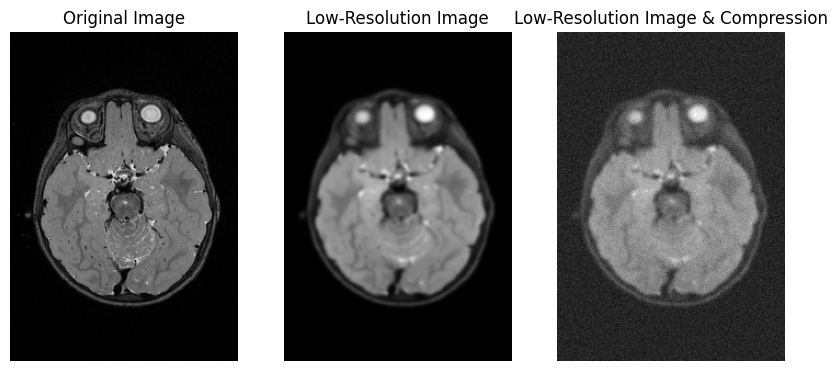

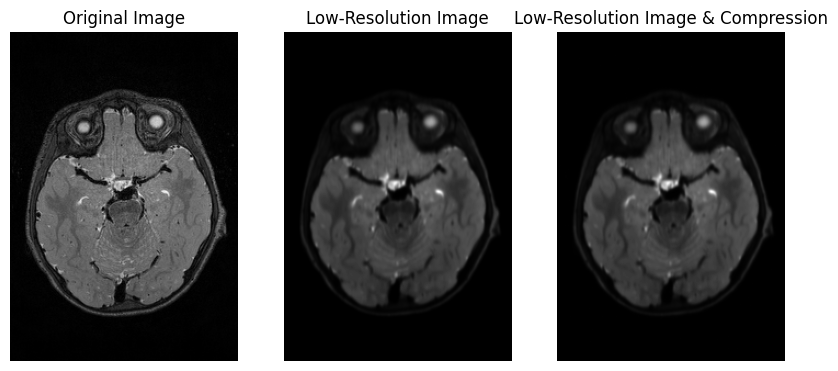

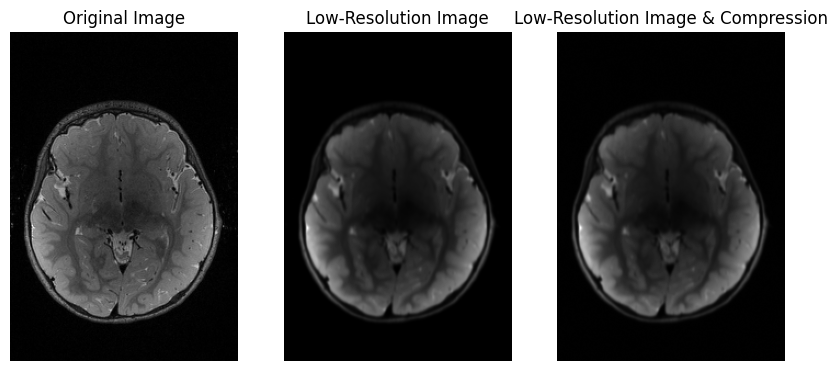

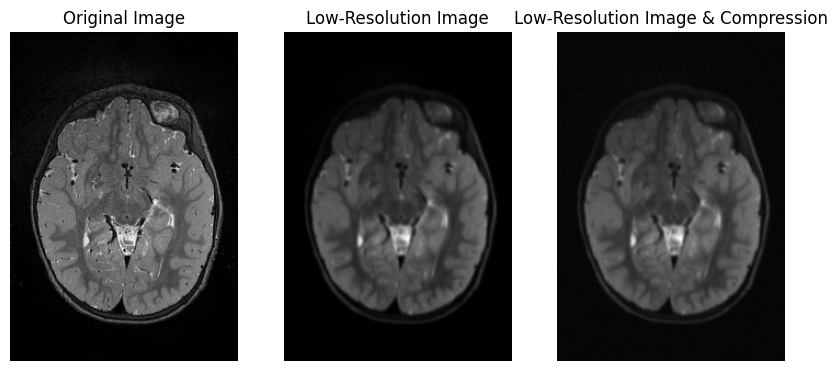

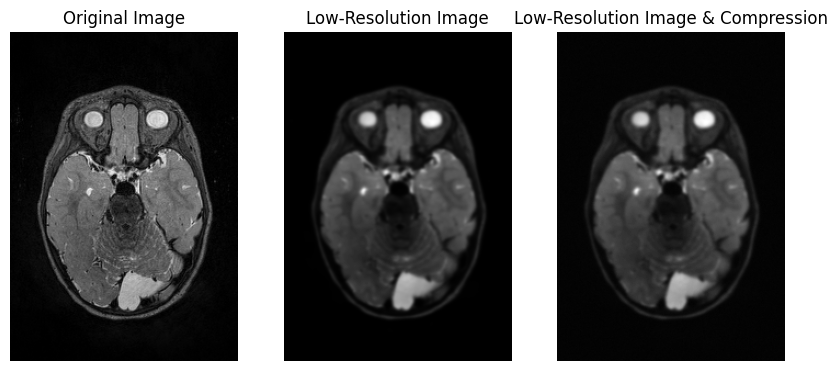

...

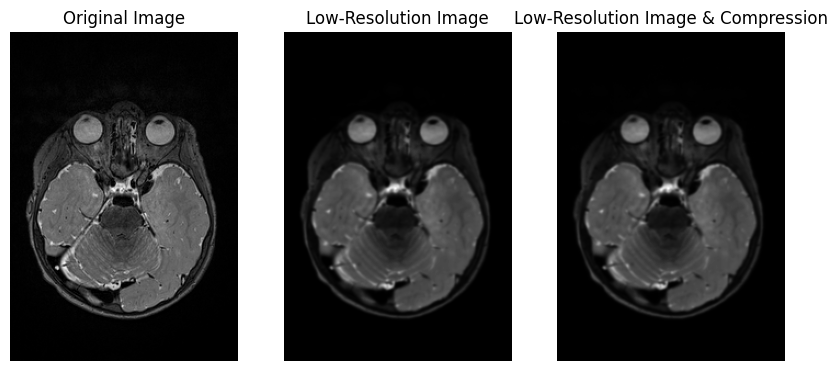

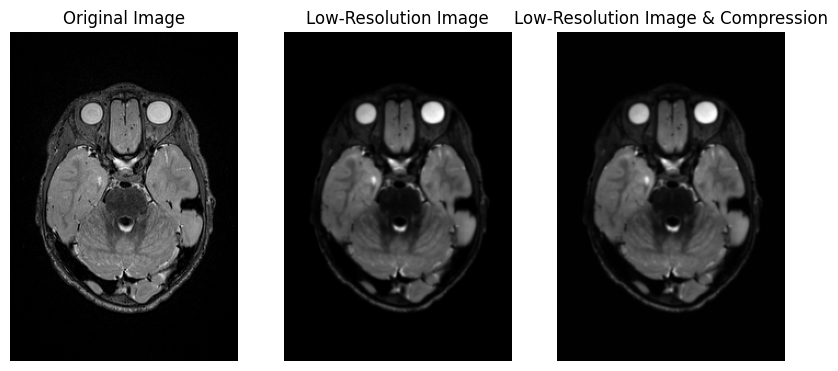

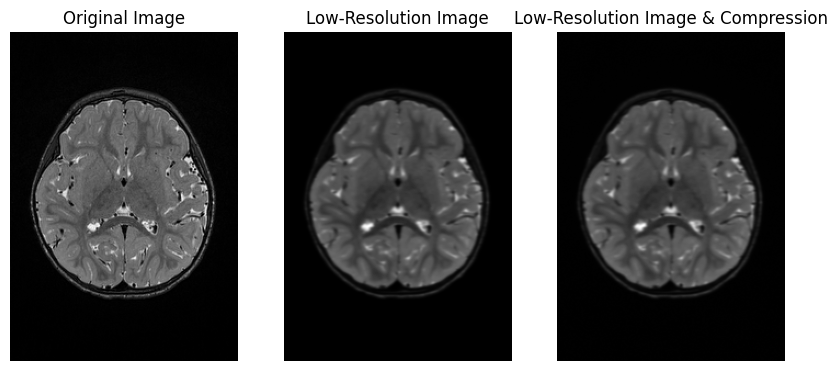

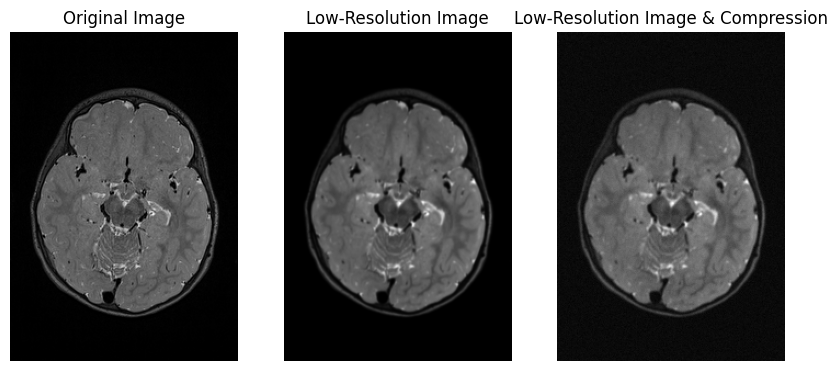

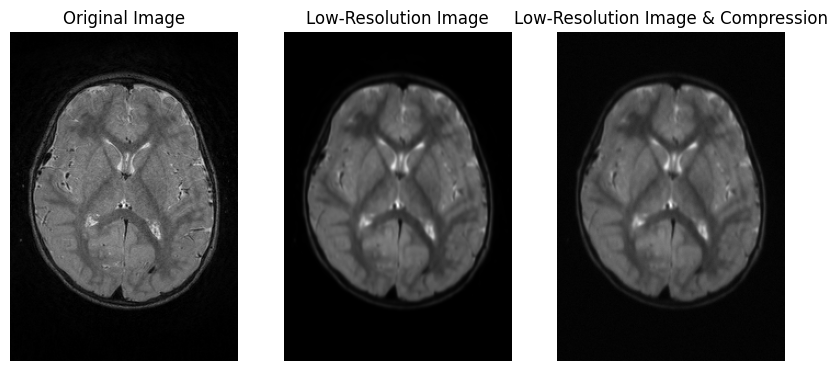

In [29]:
for i in range(len(nifti_path)):
    nifti_img = nib.load(nifti_path[i])
    image_data = nifti_img.get_fdata()
    
    file_name = nifti_path[i].split('/')[-2]
    ## smoothing
    gy  = (70. + np.random.randint(1,71))/100.
    gz  = (70. + np.random.randint(1,71))/100.
    gx  = (70. + np.random.randint(1,71))/100.

    s2  = (120. + np.random.randint(1,100+1))/100.
    image_data_g = np.power(gaussian_filter(image_data[:,:,:,0], sigma = [gy,gz,gx]),s2)
    
 
    
    
    ##dct
    dct_image = dctn(image_data_g,type=2,norm='ortho',axes=(0,1,2))
    
    rnd_th = np.random.randint(700,800)/10.
    coeff_trheshold = np.percentile(np.abs(dct_image),rnd_th)
    dct_image[np.abs(dct_image) < coeff_trheshold] = 0
    
    low_res_image = idctn(dct_image,type=2,norm = 'ortho',axes=(0,1,2))
    
    
    #gaussian noise 추가
    n_gauss = np.random.normal(0,32,low_res_image.shape)
    low_res_image = low_res_image + n_gauss
    
    slice_index = image_data.shape[2] // 2

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(image_data[:, 161,: ], cmap='gray')
    plt.axis('off')
    plt.title('Original Image')
    plt.subplot(1, 3, 2)
    plt.imshow(image_data_g[:, 161, :], cmap='gray')
    plt.axis('off')
    plt.title('Low-Resolution Image')
    plt.subplot(1, 3, 3)
    plt.imshow(low_res_image[:, 161, :], cmap='gray')
    plt.axis('off')
    plt.title('Low-Resolution Image & Compression')
    #plt.subplot(1,3,3)
    #plt.imshow(np.rot90(t2[:,:,180]),cmap = 'gray')
    #plt.title('T2')
    plt.show()
    
    
    
#     low_res_nifti = nib.Nifti1Image(low_res_image,affine= nifti_img.affine)
#     nib.save(low_res_nifti,f'/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/{file_name}/low_3d_T2.nii.gz')
    


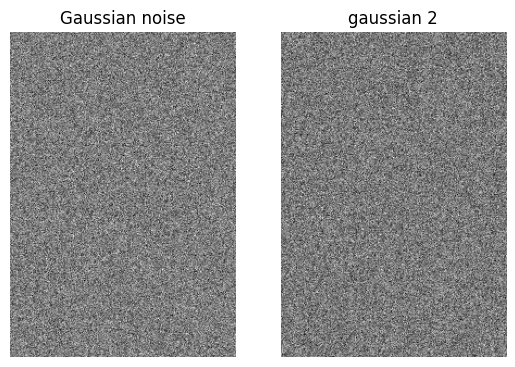

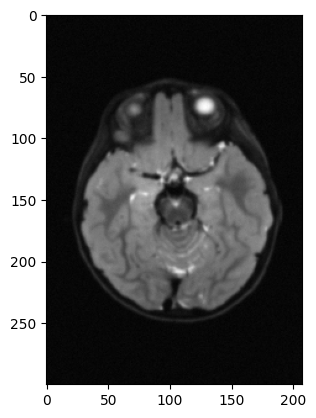

In [23]:
n_gauss = np.random.normal(0,32,low_res_image.shape)
n_gauss2 = np.random.normal(0,128,low_res_image.shape)
low_res_image_3 = low_res_image + n_gauss2

plt.subplot(121)
plt.imshow(n_gauss[:,160,:],cmap='gray')
plt.axis('off')
plt.title('Gaussian noise')
plt.subplot(122)
plt.imshow(n_gauss2[:,160,:],cmap='gray')
plt.axis('off')
plt.title('gaussian 2')
plt.show()

plt.imshow(low_res_image_3[:,160,:],cmap='gray')

In [12]:
dct_image = dctn(image_data_g,type=2,norm='ortho',axes=(0,1,2))

In [ ]:
rnd_th = np.random.randint(960,980)/10.
print(rnd_th)
coeff_trheshold = np.percentile(np.abs(dct_image),rnd_th)
dct_image[np.abs(dct_image) < coeff_trheshold] = 0

In [ ]:
low_res_image = idctn(dct_image,type=2,norm = 'ortho',axes=(0,1,2))

In [ ]:
slice_index = image_data.shape[2] // 2

plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1)
plt.imshow(image_data[:, 161,: ], cmap='gray')
plt.title('Original Image')
plt.subplot(1, 3, 2)
plt.imshow(image_data_g[:, 161, :], cmap='gray')
plt.title('Low-Resolution Image')
plt.subplot(1, 3, 3)
plt.imshow(low_res_image[:, 161, :], cmap='gray')
plt.title('Low-Resolution Image & Compression')
#plt.subplot(1,3,3)
#plt.imshow(np.rot90(t2[:,:,180]),cmap = 'gray')
#plt.title('T2')
plt.show()

In [ ]:
low_res_image.shape

In [ ]:
plt.imshow((image_data[:,:,:,0] - low_res_image)[:,slice_index,:], cmap='gray')
plt.colorbar()

In [ ]:
low_res_nifti = nib.Nifti1Image(low_res_image,affine= nifti_img.affine)
outpath = 'test_2.nii.gz'
nib.save(low_res_nifti,outpath)

In [ ]:
len(nifti_path)
nifti_path

### for

In [ ]:
for i in range(len(nifti_path)):
    nifti_img = nib.load(nifti_path[i])
    image_data = nifti_img.get_fdata()
    dct_image = dctn(image_data,type=2,norm='ortho',axes=(0,1,2))
    
    coeff_trheshold = np.percentile(np.abs(dct_image),95)
    dct_image[np.abs(dct_image) < coeff_trheshold] = 0
    
    low_res_image = idctn(dct_image,type=2,norm = 'ortho',axes=(0,1,2))

#     plt.figure(figsize=(10, 5))
#     plt.subplot(1, 2, 1)
#     plt.imshow(image_data[:, 150,: ], cmap='gray')
#     plt.title('Original Image')
#     plt.subplot(1, 2, 2)
#     plt.imshow(low_res_image[:, 150, :], cmap='gray')
#     plt.title('Low-Resolution Image')
    
    low_res_nifti = nib.Nifti1Image(low_res_image,affine= nifti_img.affine)
    
    nib.save(low_res_nifti,f'/nfs/hufsaims/kjh_shared/euna/data_bcp/to_use/T2_{i}.nii.gz')